In [9]:
suppressPackageStartupMessages({
    library("dplyr")
    library("Matrix")
    library("Seurat")
    library("SeuratWrappers")
    library("tictoc")
    library("ggplot2")
    library("ggpubr")
    library("future")
    library("SingleR")
    library("scRNAseq")
    library("pheatmap")
})

In [10]:
load("./PP1_data/FLaLP_PP1.rda")
load("200220-FLaLP-PP1(multiplets).rda")

In [12]:
putative_singlets<-setdiff(colnames(seu), putative_doublets)
seu<-subset(seu, cells=putative_singlets)

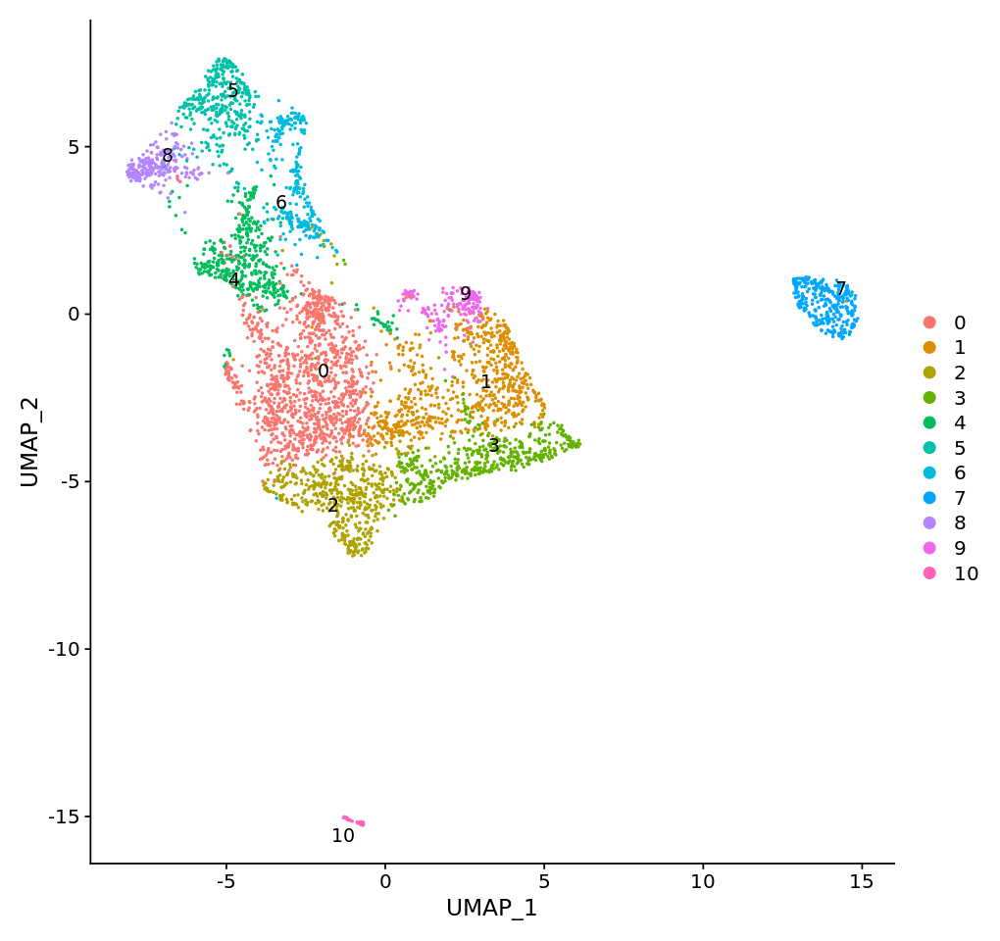

In [15]:
options(repr.plot.width=8.5, repr.plot.height=8)
UMAPPlot(seu, group.by="RNA_snn_res.0.5", label=T, repel=T)

# Primary normalization and clustering

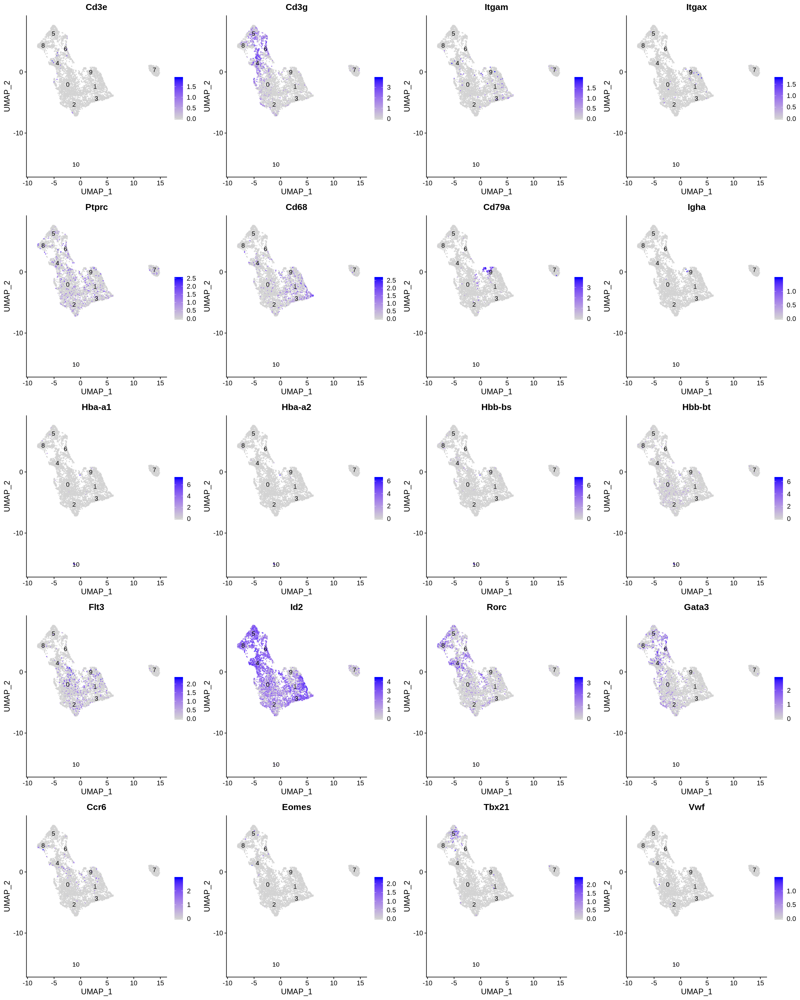

In [20]:
options(repr.plot.width=5*4, repr.plot.height=5*5,repe.plot.resolution=300)
FeaturePlot(seu, ncol=4, label=T,
            features = c("Cd3e","Cd3g","Itgam","Itgax",
                         "Ptprc","Cd68","Cd79a","Igha",
                         "Hba-a1","Hba-a2","Hbb-bs","Hbb-bt",
                         "Flt3","Id2","Rorc","Gata3",
                         "Ccr6","Eomes","Tbx21","Vwf"))

# Primary cell type allocation

## SingleR cell type annotation

## Reference datasets provided by SingleR

- Human

    HumanPrimaryCellAtlasData()
    
    BlueprintEncodeData()
    
    DatabaseImmuneCellExpressionData()
    
    NovershternHematopoieticData()
    
    MonacoImmuneData()
    

- Mouse

    ImmGenData()
    
    MouseRNAseqData()

In [16]:
tic()
ref       <- ImmGenData()
mat       <- GetAssayData(seu, slot="data")
pred.immgen.fine <- SingleR(test = mat, ref = ref, labels = ref$label.fine)
pred.immgen.main <- SingleR(test = mat, ref = ref, labels = ref$label.main)
toc()

seu[["pred.immgen.fine"]]      <-pred.immgen.fine$labels
seu[["pred.immgen.finepruned"]]<-pred.immgen.fine$pruned.labels

seu[["pred.immgen.main"]]      <-pred.immgen.main$labels
seu[["pred.immgen.mainpruned"]]<-pred.immgen.main$pruned.labels

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

snapshotDate(): 2019-10-22

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

see ?SingleR and browseVignettes('SingleR') for documentation

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

loading from cache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

see ?SingleR and browseVignettes('SingleR') for documentation

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

loading from cache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache

Using temporary cache /tmp/RtmpQwniSw/BiocFileCache



674.38 sec elapsed


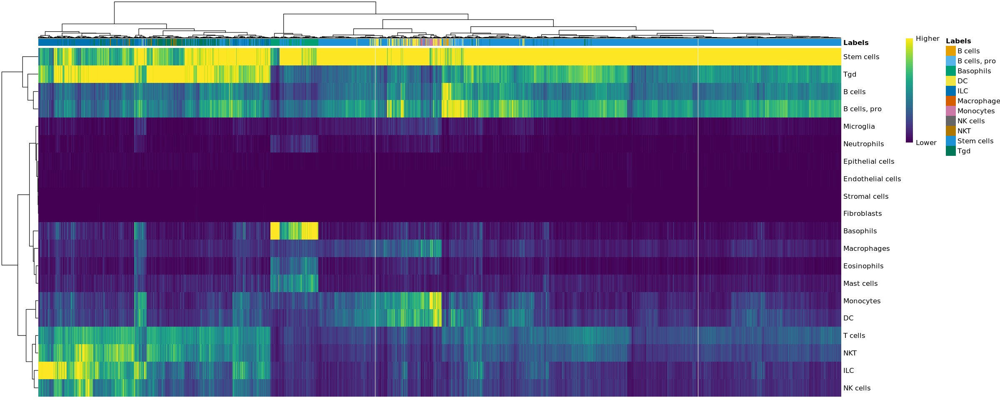

In [17]:
options(repr.plot.width=20, repr.plot.height=8)
plotScoreHeatmap(pred.immgen.main)

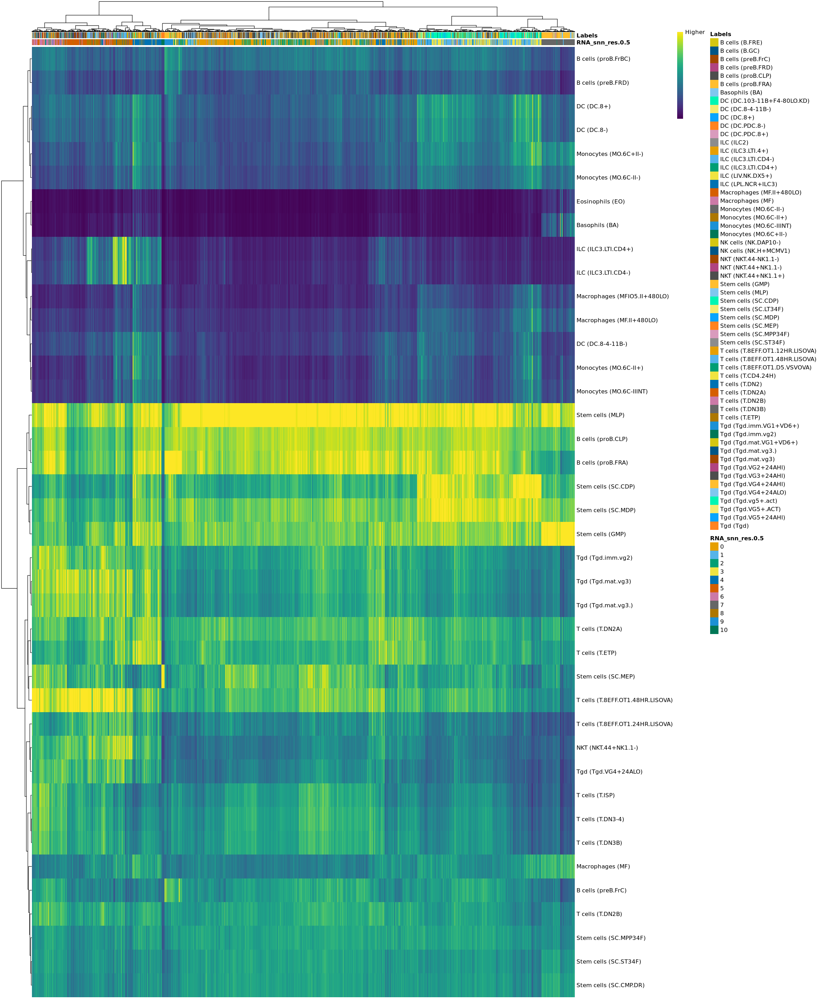

In [18]:
options(repr.plot.width=20, repr.plot.height=24)
plotScoreHeatmap(pred.immgen.fine,annotation_col=as.data.frame(seu[["RNA_snn_res.0.5"]]) )

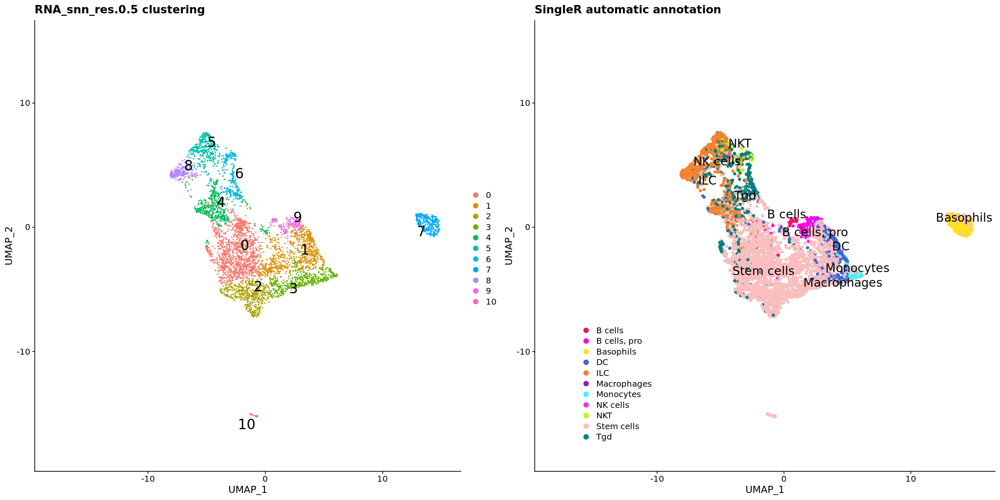

In [21]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.5"
ggarrange(
    UMAPPlot(seu, 
             group.by="RNA_snn_res.0.5", label=T, repel=T, label.size=7)+xlim(-18,15)+ylim(-18,15)+theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.5 clustering"),
    
    DimPlot(seu, 
         group.by="pred.immgen.main", label.size=6, 
         cols=c('#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231', 
                '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1.5,label=T, repel=T)+xlim(-18,15)+ylim(-18,15)+theme(legend.position =c(0.1,0.2))+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)


Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Cd244a”


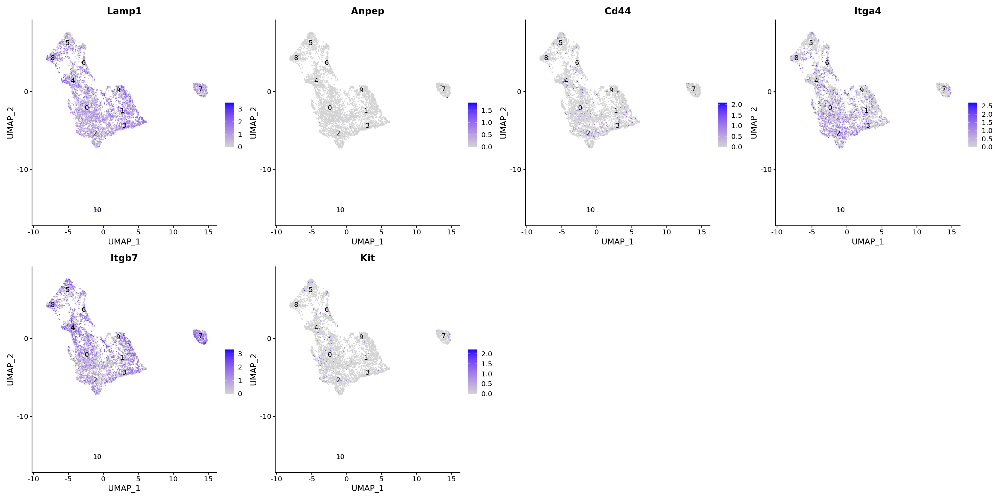

In [20]:
options(repr.plot.width=6*4, repr.plot.height=6*2,repe.plot.resolution=300)
FeaturePlot(seu, ncol=4, label=T,
            features = c("Lamp1","Anpep","Cd44","Itga4","Itgb7","Cd244a","Kit"))

### Subset cells

Based on featured gene expression and the automatic cell type identification results, 

we excluded the cluster 7 and cluster 10 for they are unlikely to be in the ILC lineage.

We further excluded a small number of Cd3e-positive, Cd79a-positive, Hba-positive, and Vwf-positive cells

for they are not in the ILC lineage either. 

We also removed putative doublets.

In [22]:
# misc
seu<- subset(seu, subset=RNA_snn_res.0.5!=10 &RNA_snn_res.0.5!=7)

# T-cell
seu<- subset(seu, Cd3e==0, slot="counts")

# B cell
seu<- subset(seu, Cd79a==0, slot="counts")

# RBC
seu<- subset(seu, `Hba-a1`<3, slot="data")

# Endothelia
seu<- subset(seu, Vwf==0, slot="counts")


In [14]:
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)
plan("sequential")
seu <- ScaleData(seu,  features=rownames(seu), block.size = 1000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8),verbose=FALSE)
toc()

Centering and scaling data matrix



8.226 sec elapsed
22.694 sec elapsed
3.597 sec elapsed


In [119]:
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 1500)

load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.g2m.rda"))
load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.s.rda"))
seu<-CellCycleScoring(seu, s.features=mm.s, g2m.features=mm.g2m)

plan("multiprocess", workers = 8)
options(future.globals.maxSize = 3*1000 * 1024^2)
seu <- ScaleData(seu,  features=rownames(seu), vars.to.regress = c("nCount_RNA", "S.Score","G2M.Score"),
                 block.size = 2000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, n.neighbors = 10, min.dist = 0.1, umap.method = "umap-learn", metric = "correlation", verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9),verbose=FALSE)
toc()

Regressing out nCount_RNA, S.Score, G2M.Score

Centering and scaling data matrix



42.614 sec elapsed
10.703 sec elapsed
5.135 sec elapsed


Rank k = 24

Identifying non-zero values

Computing Randomized SVD

Find the 0.001000 quantile of each gene

Thresholding by the most negative value of each gene

Scaling all except for 16608 columns

0.00% of the values became negative in the scaling process and were set to zero

The matrix went from 5.78% nonzero to 24.32% nonzero

Setting default assay as alra



imputation: 84.979 sec elapsed


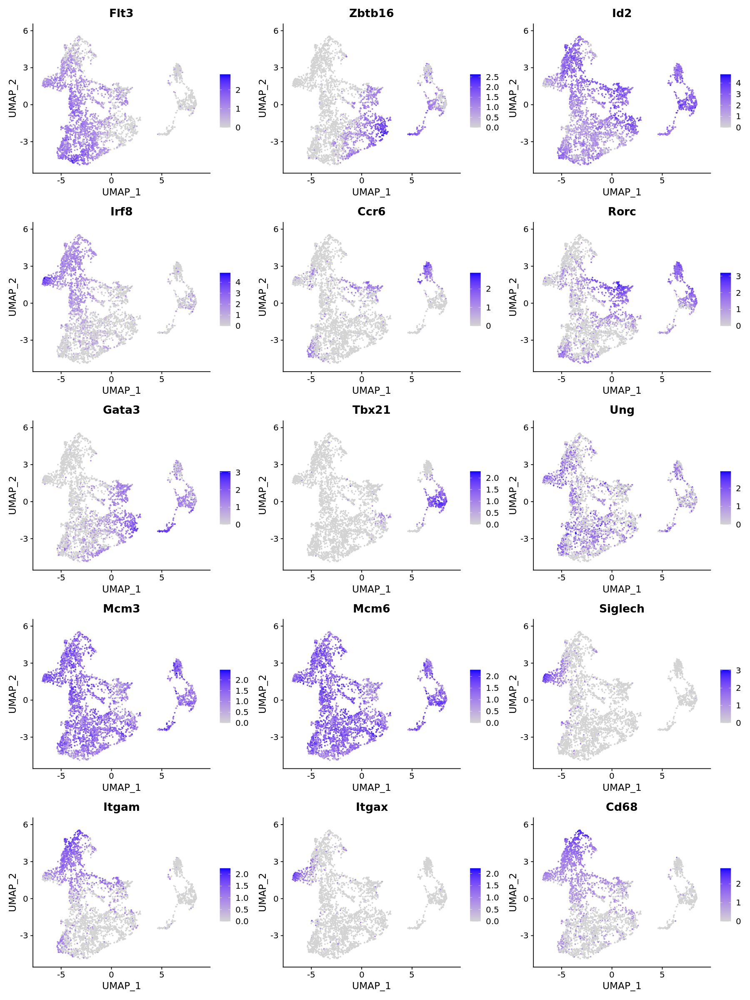

In [133]:
tic("imputation")
seu.imputed<-RunALRA(seu)
toc()
options(repr.plot.width=15, repr.plot.height=20)
FeaturePlot(seu.imputed,ncol=3, features = c("Flt3","Zbtb16","Id2","Irf8","Ccr6","Rorc","Gata3","Tbx21","Ung","Mcm3","Mcm6","Siglech",
                                             "Itgam","Itgax","Cd68"))

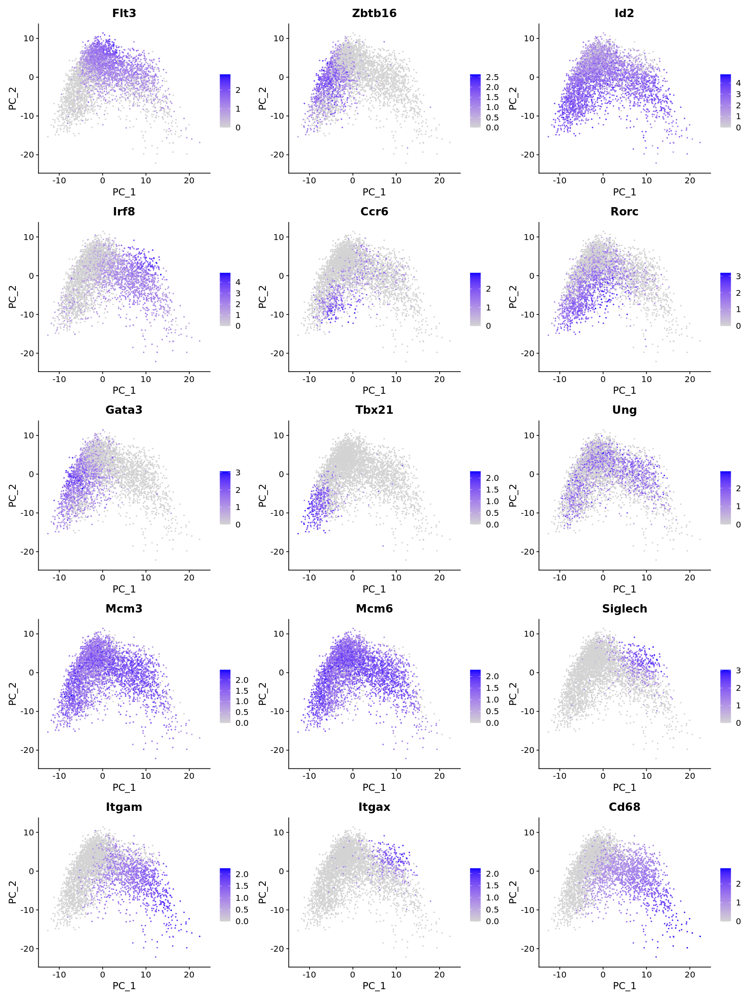

In [134]:
options(repr.plot.width=15, repr.plot.height=20)
FeaturePlot(seu.imputed,ncol=3,reduction = "pca", features = c("Flt3","Zbtb16","Id2","Irf8","Ccr6","Rorc","Gata3","Tbx21","Ung","Mcm3","Mcm6","Siglech",
                                             "Itgam","Itgax","Cd68"))

In [122]:
selected.genes<-c("Flt3","Id2","Zbtb16","Irf8")
expression<-as.data.frame(t(seu.imputed@assays$alra@data[selected.genes,]))

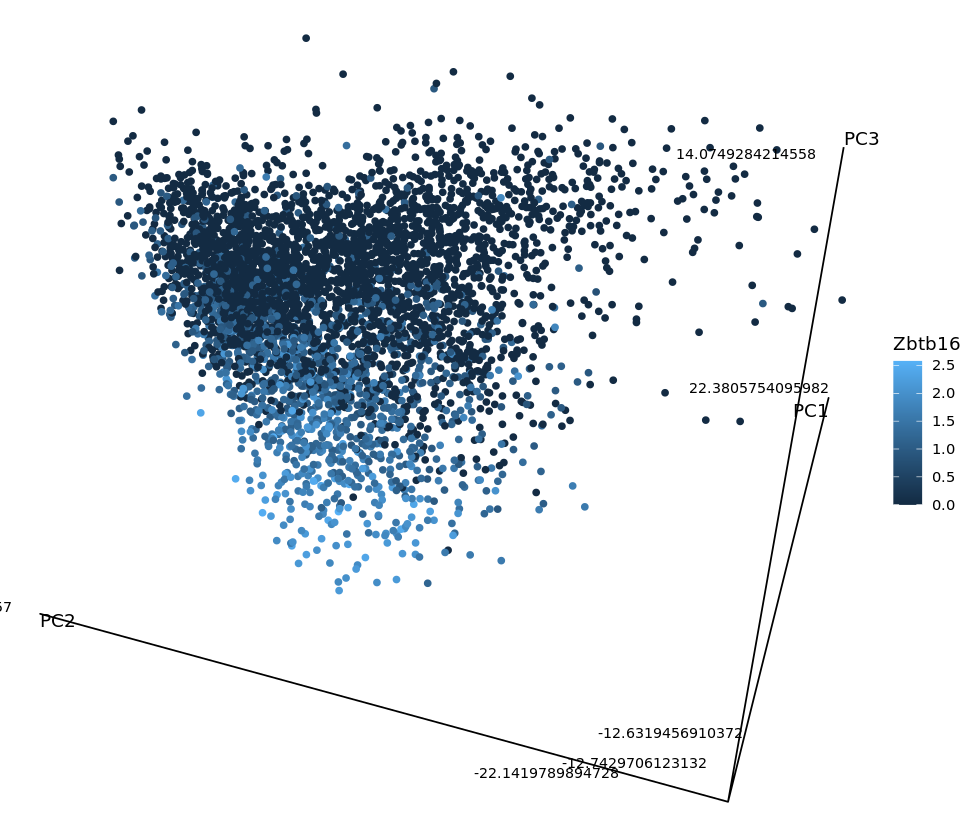

In [131]:
options(repr.plot.width=8, repr.plot.height=7)

library("gg3D")
theta=-70
phi=30


ggplot(cbind(seu[[]],
             seu@reductions$pca@cell.embeddings[,1:3],
             expression
            ),
       aes(x=PC_1, y=PC_2, z=PC_3, color=Zbtb16)
      ) + 
axes_3D(theta=theta, phi=phi) +
stat_3D(theta=theta, phi=phi) +
axis_labs_3D(theta=theta, phi=phi, size=3, 
             hjust=c(1,1,1.2,1.2,1.2,1.2), 
             vjust=c(-.5,-.5,-.2,-.2,1.2,1.2)) +
labs_3D(theta=theta, phi=phi, 
        hjust=c(1,0,0), vjust=c(1.5,1,-.2),
        labs=c("PC1", "PC2", "PC3")) +
theme_void()

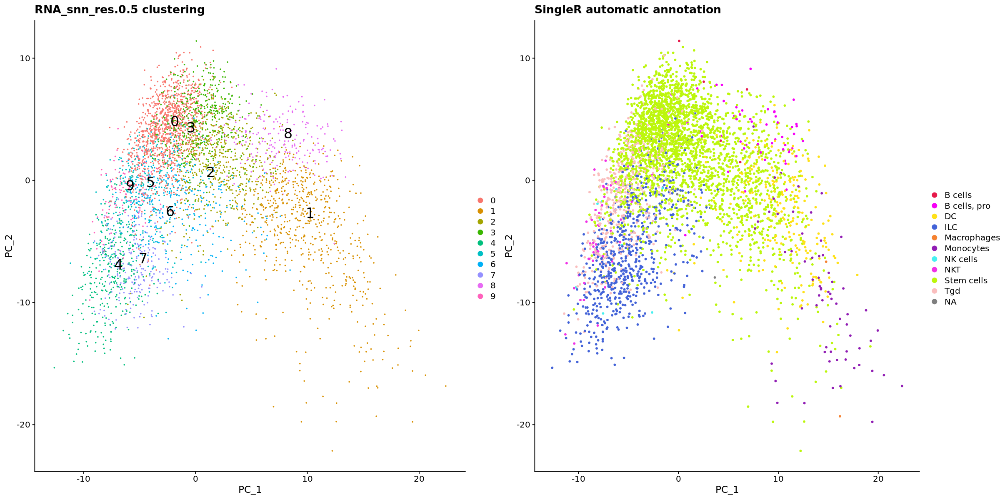

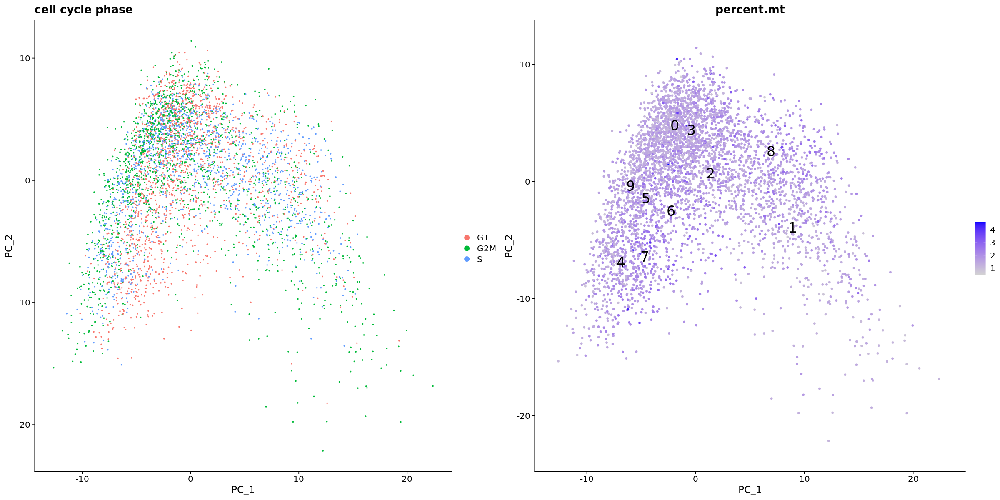

In [135]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.5"
ggarrange(
    DimPlot(seu, reduction = "pca",
             group.by="RNA_snn_res.0.5", label=T, repel=T, label.size=7) +theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.5 clustering"),
    
    DimPlot(seu, reduction = "pca",
         group.by="pred.immgen.mainpruned", label.size=6, 
         cols=c('#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231', 
                '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1,label=F, repel=T) +theme(legend.position ="right")+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)

ggarrange(
    DimPlot(seu, reduction = "pca",
             group.by="Phase", label=F, repel=T, label.size=7) +theme(legend.position = "right")+
    ggtitle("cell cycle phase"),
    FeaturePlot(seu,ncol=3,reduction = "pca", features = c("percent.mt"),
               pt.size=1,label=T, repel=T,label.size=7) +theme(legend.position ="right")+
    ggtitle("percent.mt"), 
    ncol=2, nrow=1
)

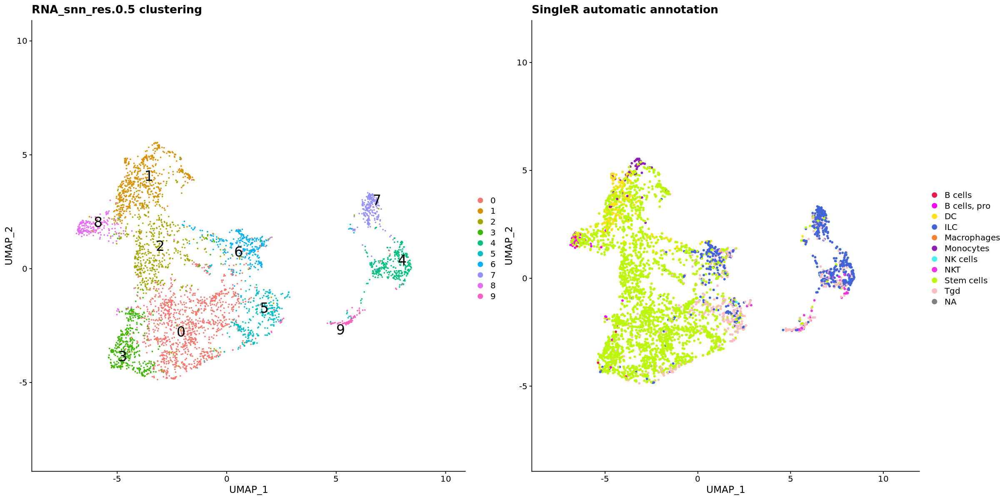

In [143]:
options(repr.plot.width=20, repr.plot.height=10)

Idents(seu)<-"RNA_snn_res.0.5"
ggarrange(
    UMAPPlot(seu, 
             group.by="RNA_snn_res.0.5", label=T, repel=T, label.size=7)+xlim(-8,10)+ylim(-8,10)+theme(legend.position = "right")+
    ggtitle("RNA_snn_res.0.5 clustering"),
    
    DimPlot(seu, 
         group.by="pred.immgen.mainpruned", label.size=6, 
         cols=c('#e6194b', '#F700F7', '#ffe119', '#4363d8', '#f58231', 
                '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', 
                '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', 
                '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'), 
         pt.size=1,label=F, repel=T)+xlim(-8,11)+ylim(-8,11)+theme(legend.position ="right")+
    ggtitle("SingleR automatic annotation"), 
    ncol=2, nrow=1
)


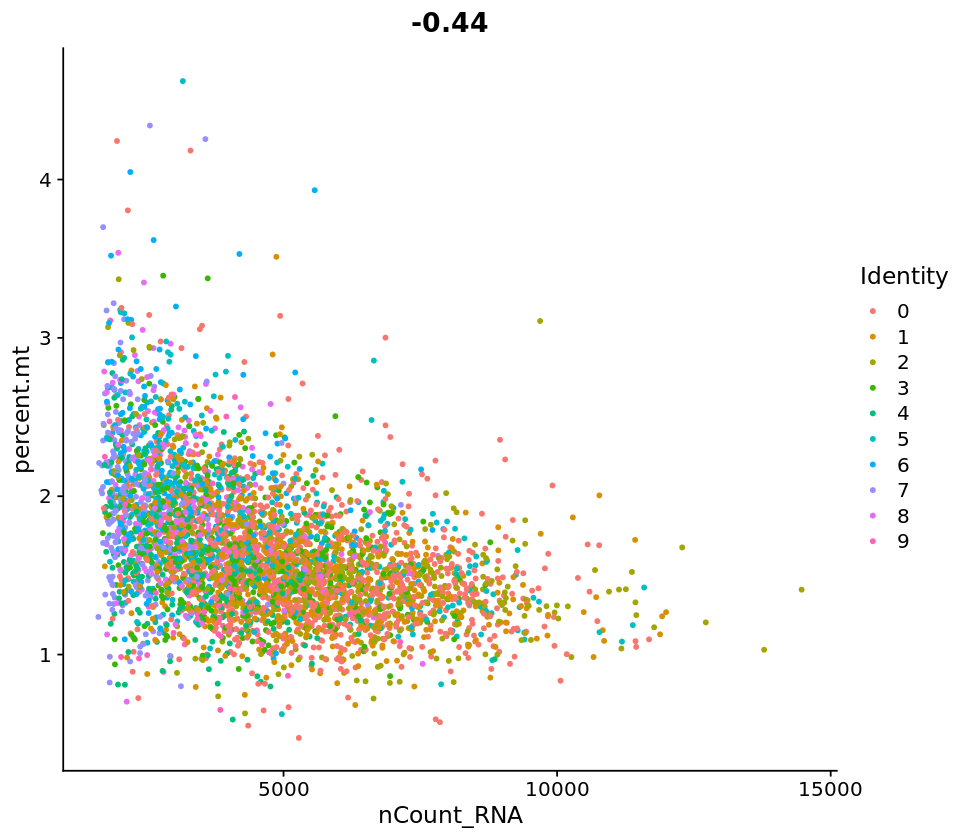

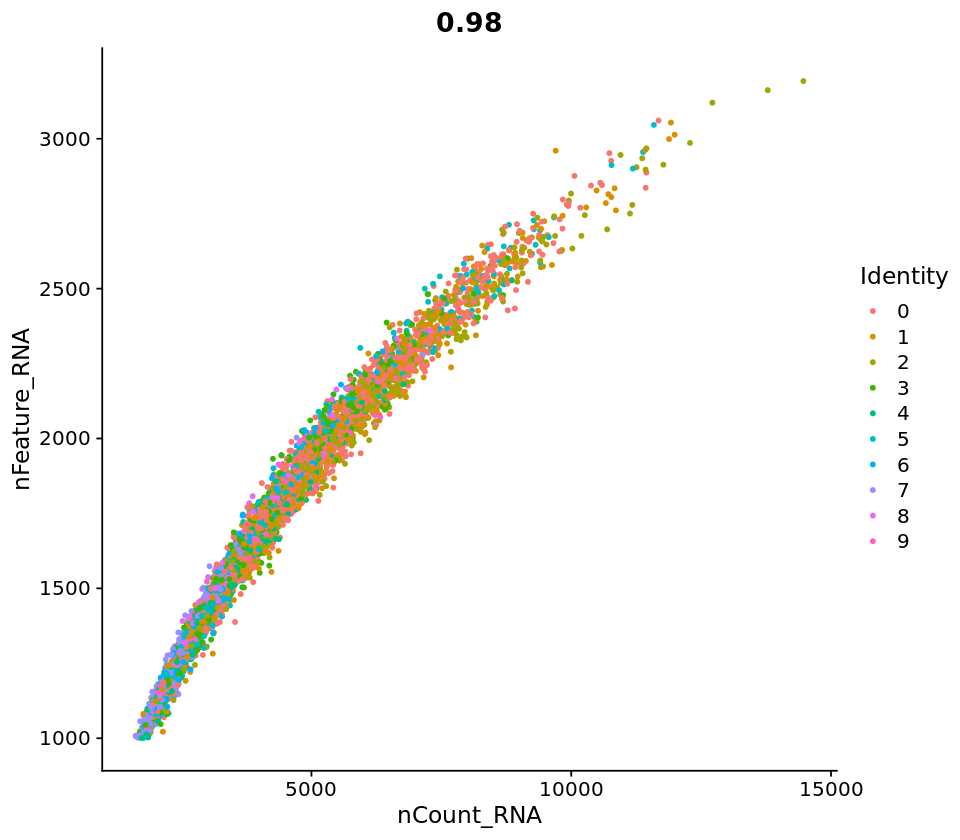

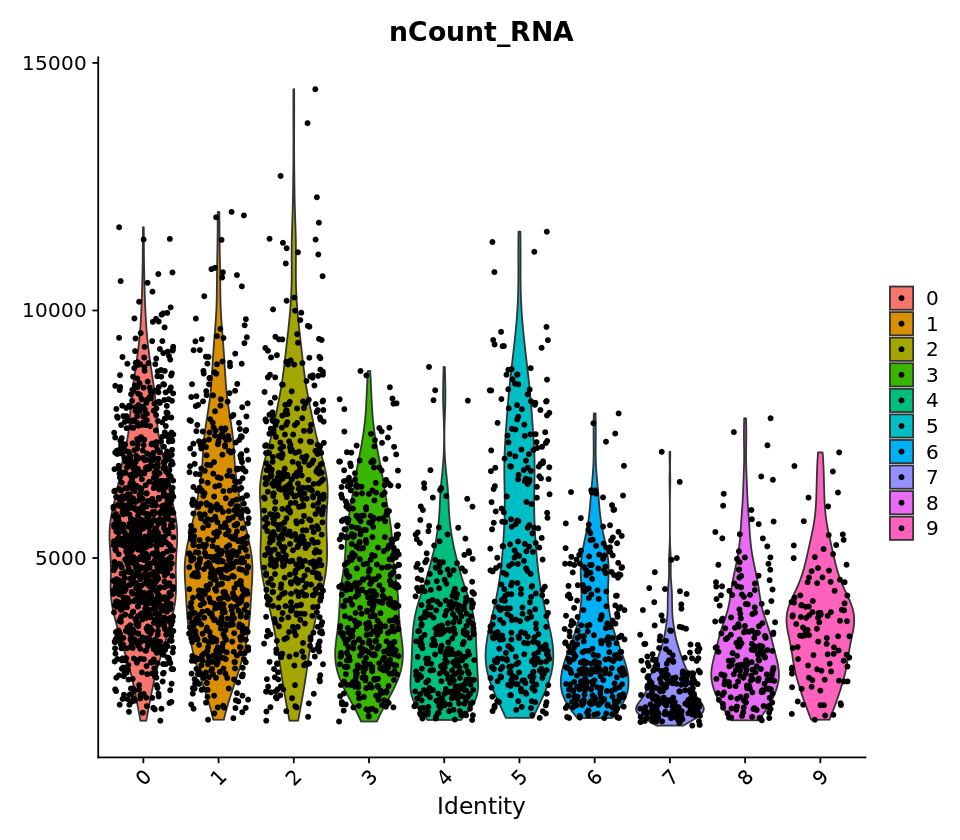

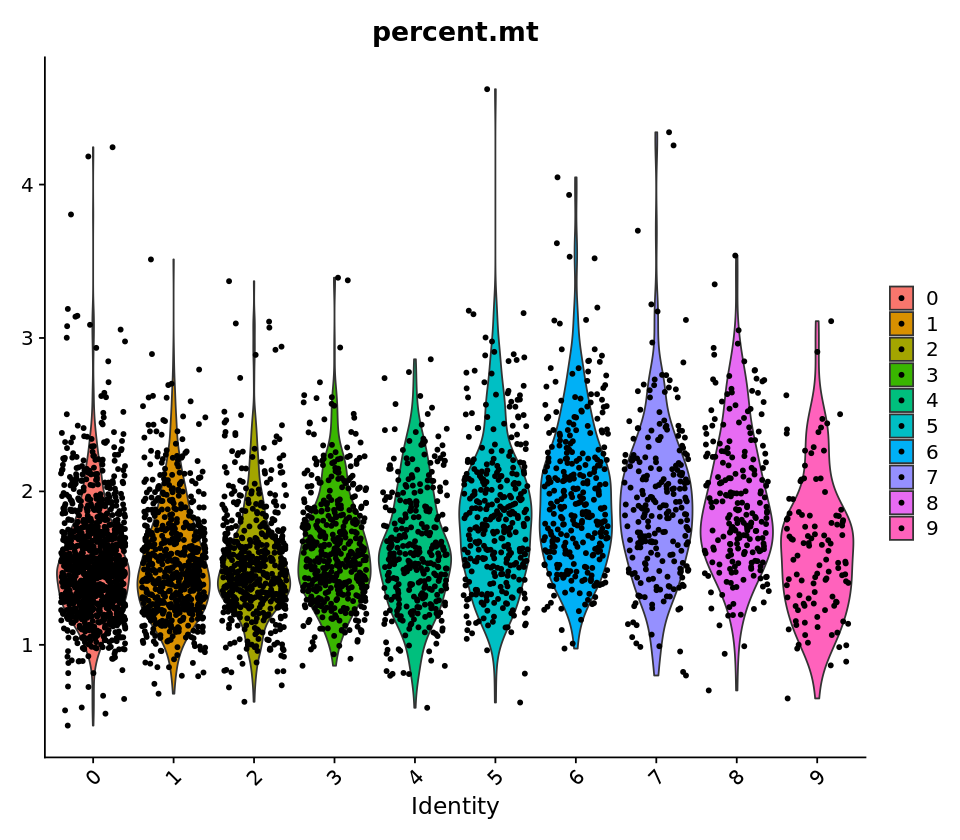

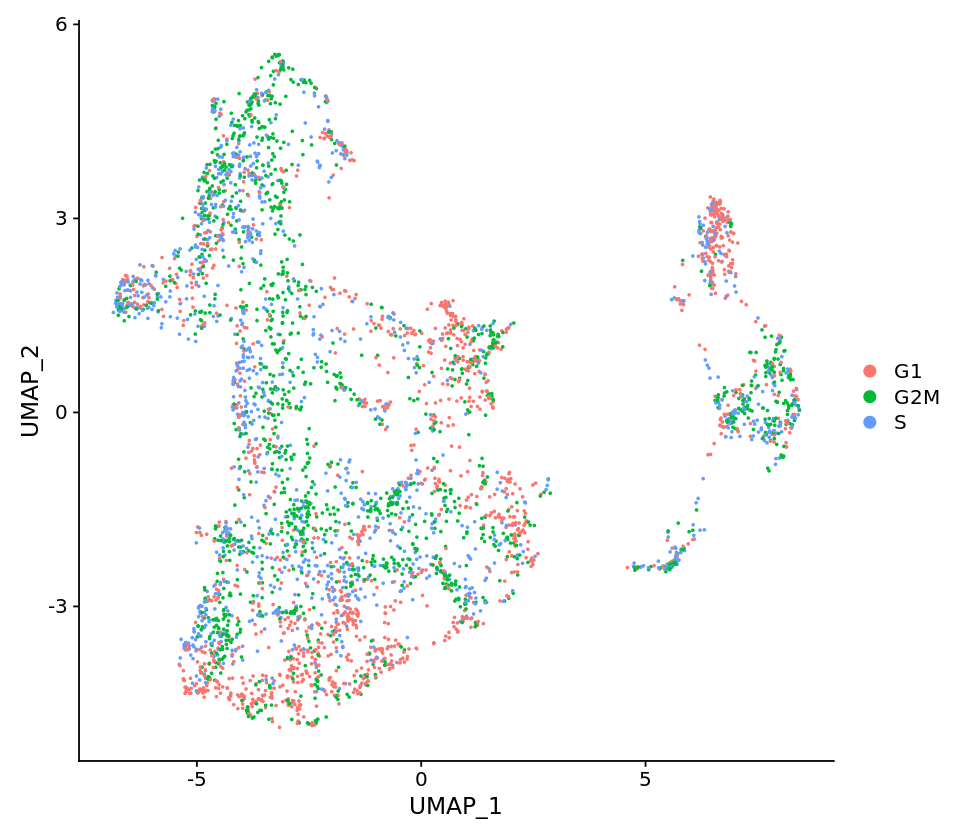

In [141]:
options(repr.plot.width=8, repr.plot.height=7)
FeatureScatter(seu, feature1 = "nCount_RNA", feature2 = "percent.mt")
FeatureScatter(seu, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
VlnPlot(seu,features = "nCount_RNA", group.by = "RNA_snn_res.0.5")
VlnPlot(seu,features = "percent.mt", group.by = "RNA_snn_res.0.5")
DimPlot(seu, group.by="Phase")

# Subset cells

In [144]:
seu.FL      <- seu
seu.ALP2    <- subset(seu, RNA_snn_res.0.5==4|RNA_snn_res.0.5==5|RNA_snn_res.0.5==6|RNA_snn_res.0.5==7|RNA_snn_res.0.5==9)
seu.ALP1    <- subset(seu, RNA_snn_res.0.5!=4&RNA_snn_res.0.5!=5&RNA_snn_res.0.5!=6&RNA_snn_res.0.5!=7&RNA_snn_res.0.5!=9)

# Save FLaLP-total

In [145]:
tic()
save(seu.FL, file="./PP2_data/FLaLP_PP2.rda", compress=T)
toc()

50.623 sec elapsed


In [146]:
tic("")
dge <- t(as.matrix(GetAssayData(seu.FL, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.FL@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/FLaLP_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP_PP2_obs.tsv")
toc()

: 107.432 sec elapsed


# Save Fetal Liver αLP2

In [157]:
seu<-seu.ALP2
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.g2m.rda"))
load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.s.rda"))
seu<-CellCycleScoring(seu, s.features=mm.s, g2m.features=mm.g2m)

options(future.globals.maxSize = 3*1000 * 1024^2)
plan("multiprocess", workers = 6)
seu <- ScaleData(seu, features=rownames(seu), block.size = 1000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, umap.method = "umap-learn", vars.to.regress = c("nCount_RNA", "S.Score","G2M.Score"),
               metric = "correlation", min.dist=0.1, n.neighbors = 20L, verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8),verbose=FALSE)
toc()

seu->seu.ALP2

Centering and scaling data matrix



6.239 sec elapsed
4.105 sec elapsed
0.88 sec elapsed


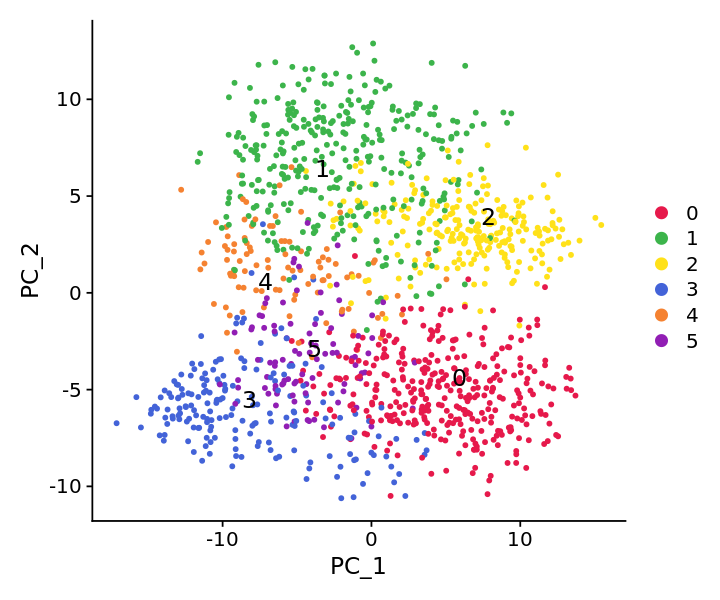

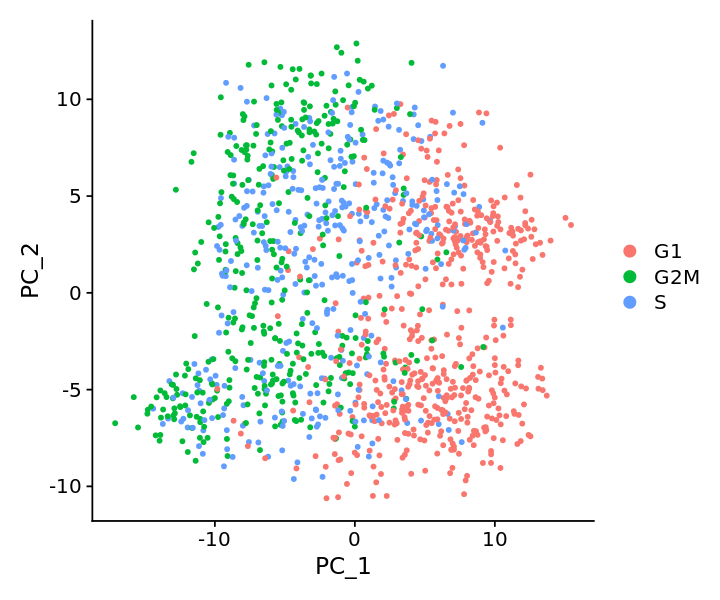

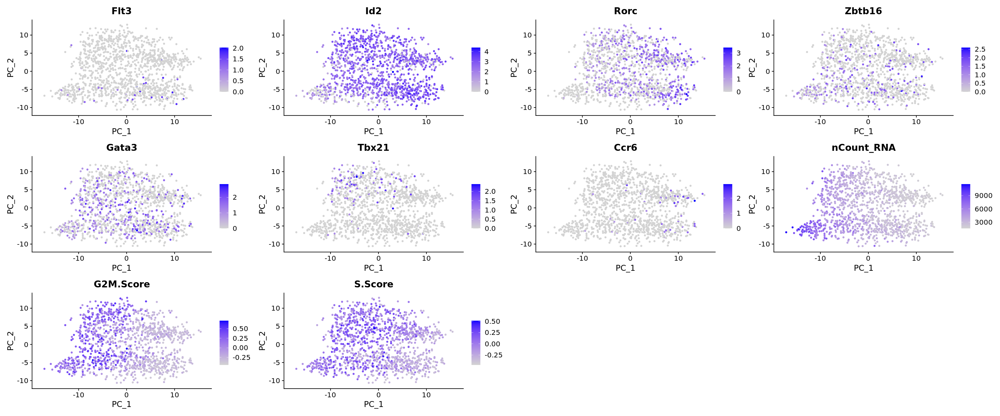

In [158]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(seu.ALP2, group.by="RNA_snn_res.0.6", label=T, label.size=5, repel=T, pt.size=1,reduction="pca",
         cols=c('#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'))
DimPlot(seu.ALP2,reduction="pca", group.by="Phase", label=F, repel=T)
options(repr.plot.width=6*4, repr.plot.height=5*2)
FeaturePlot(seu.ALP2, ncol=4,reduction="pca", features=c("Flt3","Id2","Rorc","Zbtb16","Gata3","Tbx21","Ccr6","nCount_RNA",
                                                        "G2M.Score","S.Score"))

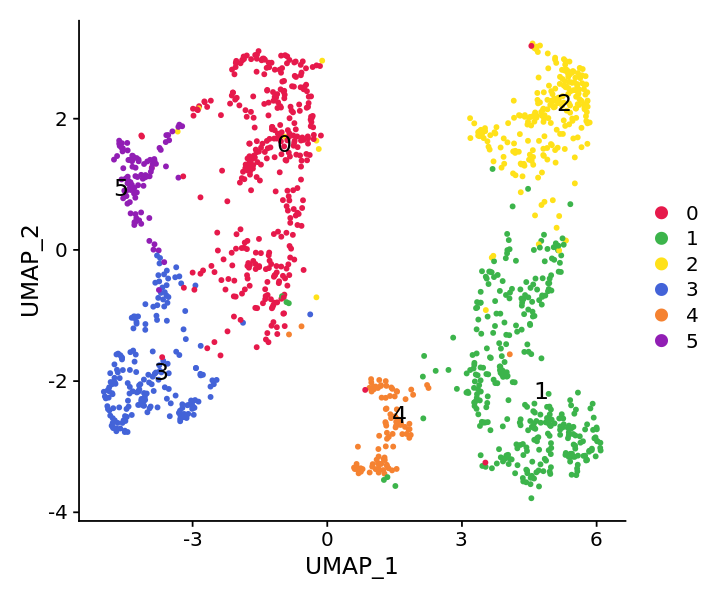

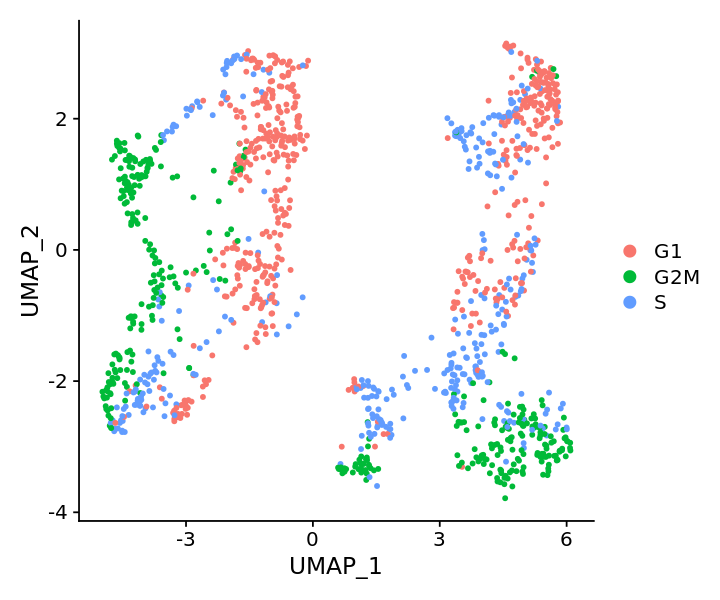

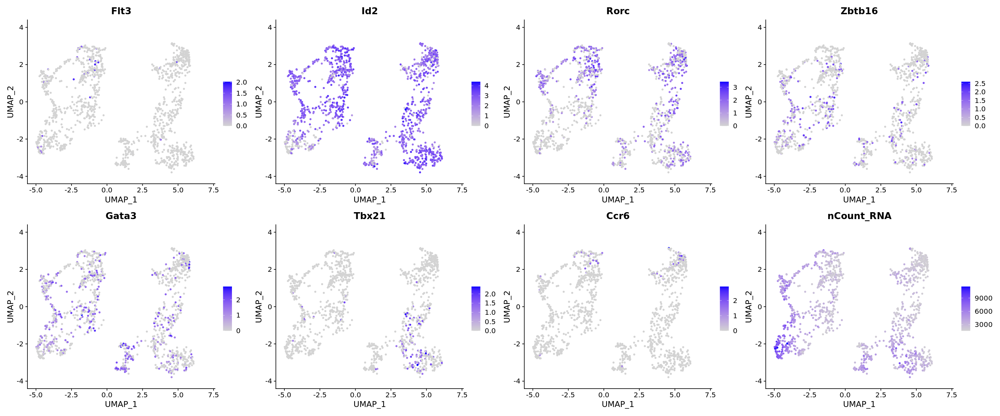

In [159]:
options(repr.plot.width=6, repr.plot.height=5)
UMAPPlot(seu.ALP2, group.by="RNA_snn_res.0.6", label=T, label.size=5, repel=T, pt.size=1,
         cols=c('#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'))
UMAPPlot(seu.ALP2, group.by="Phase", label=F, repel=T)
options(repr.plot.width=6*4, repr.plot.height=5*2)
FeaturePlot(seu.ALP2, ncol=4, features=c("Flt3","Id2","Rorc","Zbtb16","Gata3","Tbx21","Ccr6","nCount_RNA"))

In [160]:
tic()
save(seu.ALP2, file="./PP2_data/FLaLP-ALP2_PP2.rda", compress=T)
toc()

tic("")
dge <- t(as.matrix(GetAssayData(seu.ALP2, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.ALP2@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP-ALP2_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/FLaLP-ALP2_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP-ALP2_PP2_obs.tsv")
toc()

14.146 sec elapsed
: 33.043 sec elapsed


# Save Fetal Liver αLP1

In [166]:
seu<-seu.ALP1
options(warn=-1)
tic()
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.g2m.rda"))
load(url("https://raw.githubusercontent.com/chansigit/scSnippet/master/Cell_Cycle_Annotation/mm.s.rda"))
seu<-CellCycleScoring(seu, s.features=mm.s, g2m.features=mm.g2m)

options(future.globals.maxSize = 3*1000 * 1024^2)
plan("multiprocess", workers = 6)
seu <- ScaleData(seu, features=rownames(seu),vars.to.regress = c("nCount_RNA", "S.Score","G2M.Score"), block.size = 1000, min.cells.to.block = 1000)
plan("sequential")
toc()

tic()
seu <- RunPCA(seu, npcs=30, verbose = FALSE)
seu <- RunUMAP(seu, dims = 1:30, umap.method = "umap-learn", metric = "correlation", min.dist=0.05, n.neighbors = 20L, verbose = FALSE)
toc()

tic()
seu <- FindNeighbors(object = seu, dims = 1:30,verbose=FALSE)
seu <- FindClusters( object = seu, resolution = c(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8),verbose=FALSE)
toc()

seu->seu.ALP1

Regressing out nCount_RNA, S.Score, G2M.Score

Centering and scaling data matrix



31.245 sec elapsed
9.216 sec elapsed
3.044 sec elapsed


In [115]:
seu.ALP1 <- RunUMAP(seu.ALP1, dims = 1:30, umap.method = "umap-learn", metric = "correlation", min.dist=0.05, n.neighbors = 20L, verbose = FALSE)

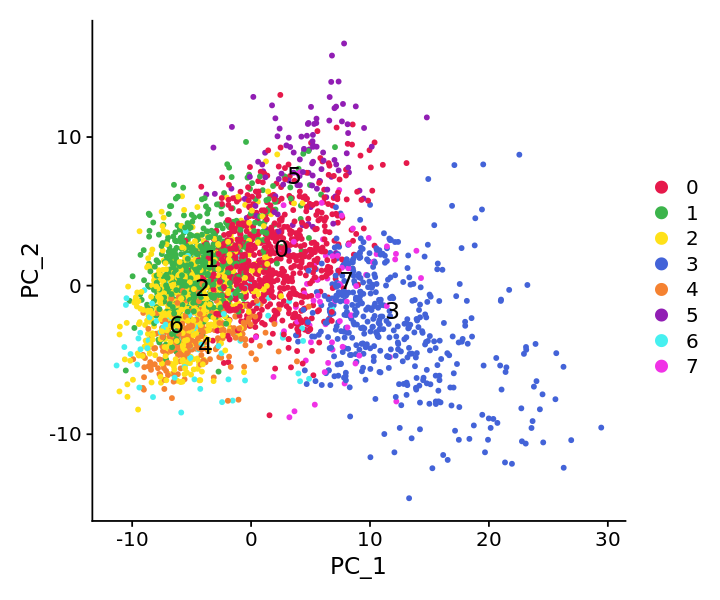

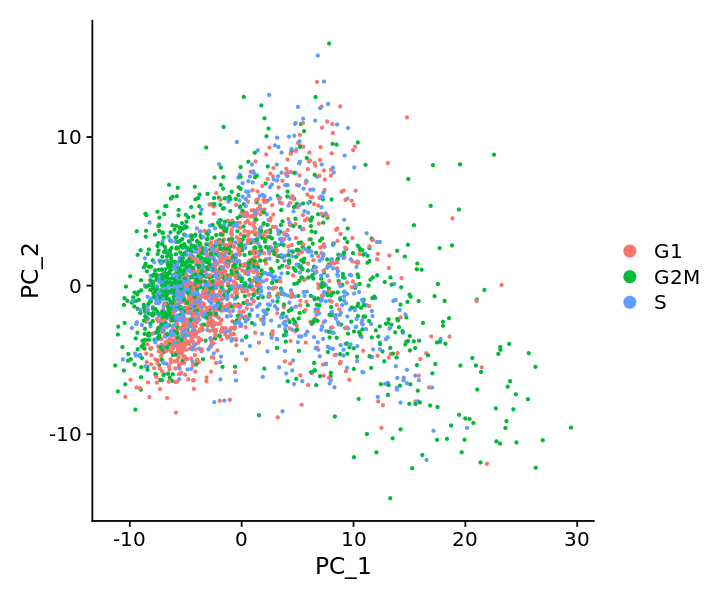

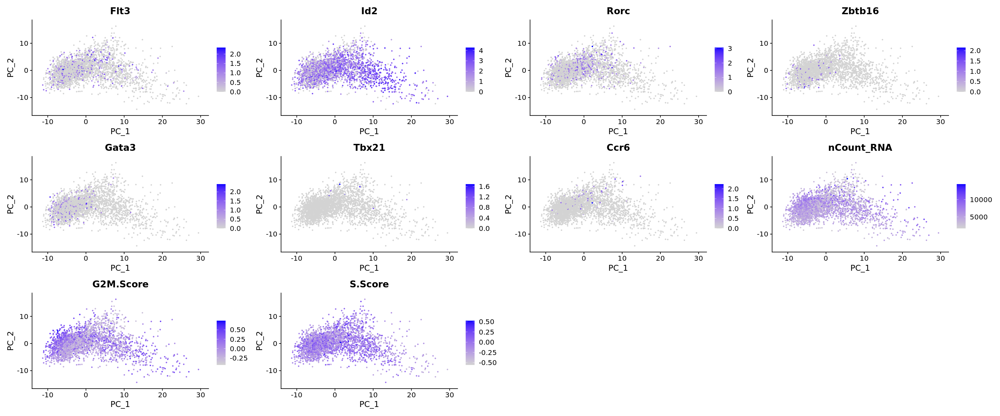

In [167]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(seu.ALP1, group.by="RNA_snn_res.0.6", label=T, label.size=5, repel=T, pt.size=1,reduction="pca",
         cols=c('#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'))
DimPlot(seu.ALP1,reduction="pca", group.by="Phase", label=F, repel=T)
options(repr.plot.width=6*4, repr.plot.height=5*2)
FeaturePlot(seu.ALP1, ncol=4,reduction="pca", features=c("Flt3","Id2","Rorc","Zbtb16","Gata3","Tbx21","Ccr6","nCount_RNA",
                                                        "G2M.Score","S.Score"))

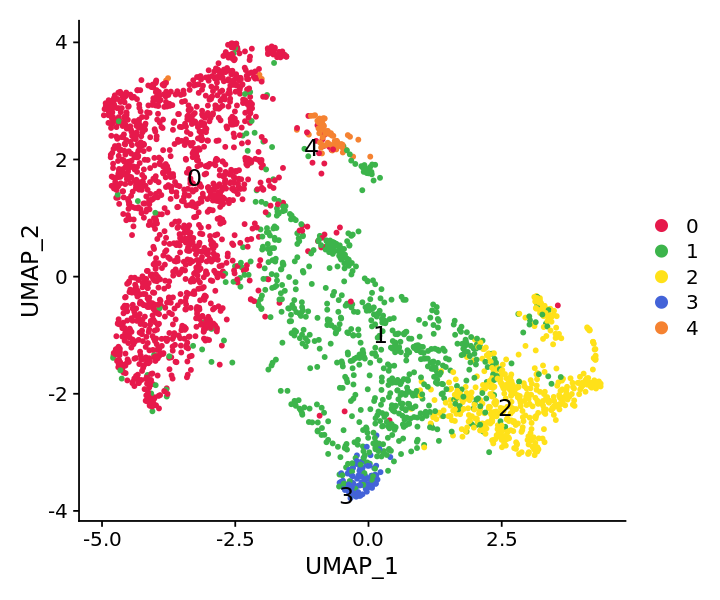

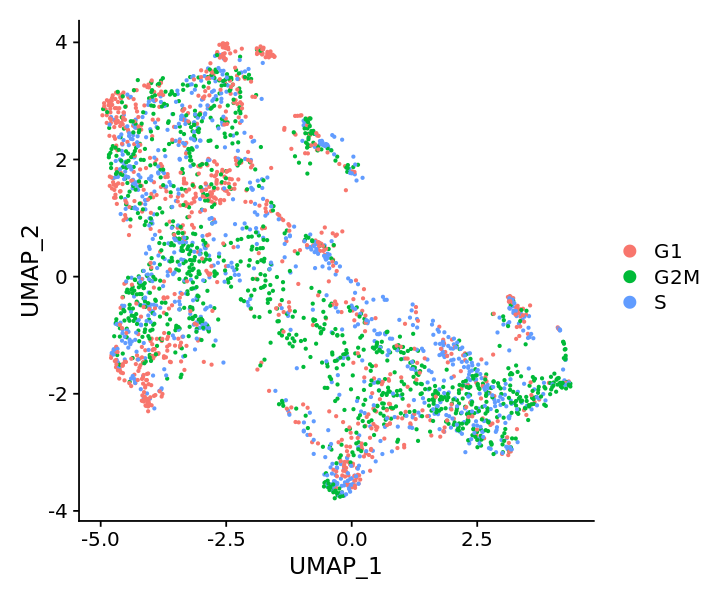

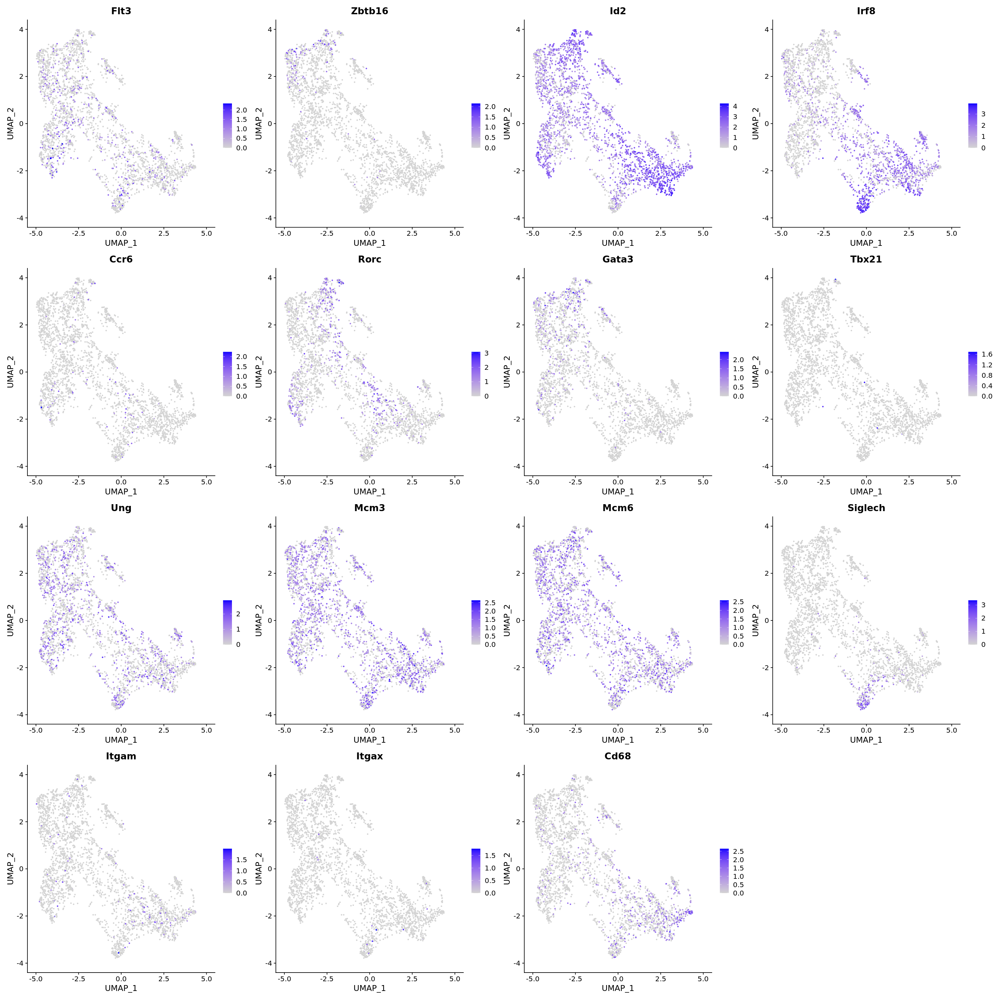

In [173]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(seu.ALP1, group.by="RNA_snn_res.0.4", label=T, label.size=5, repel=T, pt.size=1, 
         cols=c('#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#4f34ff', '#f340F0'))
DimPlot(seu.ALP1, group.by="Phase", label=F, repel=T)
options(repr.plot.width=6*4, repr.plot.height=6*4)
FeaturePlot(seu,ncol=4, features = c("Flt3","Zbtb16","Id2","Irf8",
                                     "Ccr6","Rorc","Gata3","Tbx21",
                                     "Ung","Mcm3","Mcm6","Siglech",
                                     "Itgam","Itgax","Cd68"))

In [174]:
tic()
save(seu.ALP1, file="./PP2_data/FLaLP-ALP1_PP2.rda", compress=T)
toc()

tic("")
dge <- t(as.matrix(GetAssayData(seu.ALP1, assay = "RNA", slot = "counts")))
var <- colnames(dge)
obs <- seu.ALP1@meta.data
write.table(dge, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP-ALP1_PP2_dge.tsv")
write.table(var, sep = "\t" ,row.names =F, col.names = F, file="./PP2_data/FLaLP-ALP1_PP2_var.tsv")
write.table(obs, sep = "\t", row.names =T, col.names = T, file="./PP2_data/FLaLP-ALP1_PP2_obs.tsv")
toc()

37.637 sec elapsed
: 77.075 sec elapsed
